# Challenge 3 : The Ising model

Arnaud RUEFF et Antonin Urruty

* Importing libraries

In [1]:
%matplotlib inline
import numpy
from matplotlib import pyplot
from matplotlib import animation
import matplotlib.cm as cm
from JSAnimation.IPython_display import display_animation

## First challenge :  Testing different initial states

* We will use the functions defined in the lesson :

In [56]:
def energy_at_site(sp,alpha,sigma,ix,iy):
    """ Computes the contribution to the energy for a given spin
    at location ix,iy for a lattice with periodic boundary conditions
   
    Parameters:
    ----------
    sp: numpy array
        array of spins
    alpha  : real
        coupling constant J/(kb*T)
    sigma   : int
        spin at site ix,iy
    ix   : int
        location in x
    iy   : int
        location in y
    
   
    Returns:
    -------
    energy: energy for the given configuration
    """
    
    energy=-alpha*sigma*(sp[(ix-1)%nx,iy]+sp[(ix+1)%nx,iy]+sp[ix,(iy-1)%ny]+sp[ix,(iy+1)%ny])

    return energy


In [57]:
def metropolis_at_site(sp,alpha,ix,iy):
    """ Flips a dipole at site ix, iy when probability condition is met 
   
    Parameters:
    ----------
    sp: numpy array
        array of spins
    alpha  : real
        coupling constant J/(kb*T)
    ix   : int
        location in x
    iy   : int
        location in y
    """
    sigma=sp[ix,iy]
    energy_before_flip = energy_at_site(sp,alpha,sigma,ix,iy)
    sigma = -sigma
    energy_if_site_flipped = energy_at_site(sp,alpha,sigma,ix,iy)
    
    # Flip the site with Metropolis probability
    # Condition is always satisifed if dE < 0
    if (numpy.random.random_sample()<numpy.exp(-(energy_if_site_flipped \
                                               -energy_before_flip))):
        sp[ix,iy]=-sp[ix,iy]

* This one wil generate random initial states !

In [59]:
def initial_state(nx,ny):
    """ Creates a lattice with random spin orientations
   
    Parameters:
    ----------
    nx   : int
        Discretization points in x
    ny   : int
        Discretization points in y
   
    Returns:
    -------
    r: 2D array of spins
    """
       
    # Uniform random spins between 0 and 1  
    r = numpy.random.random_integers(0,1,(nx,ny))
    
    # Where r=0, we assign a negative spin
    r[r==0] =-1

    return r

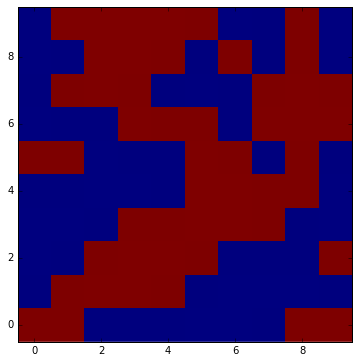

In [60]:
nx=10
ny=10

# Non-dimensional coupling constant J/(kb*T)
alpha = 0.1

r = numpy.zeros([nx,ny])

r = initial_state(nx,ny)
pyplot.figure(figsize=(6,6))
pyplot.imshow(r,interpolation="none",origin='lower')

In [61]:
NMC = 100000
states = numpy.empty(NMC+1)
states[0]=r[5,5]

for n in range(0,NMC):
    metropolis_at_site(r,alpha,5,5)
    states[n]=r[5,5]

ups = numpy.extract(states==1, states).size
downs = NMC - ups
print(ups/downs)

1.4942631946522997


Though we sometimes obtain something different, looks indeed like in the majority of initial conditions the expected average is 1,49 !


## Now, the real challenge

We will perform a series of runs with $\alpha \in [0 1]$  and plot the average energy of the system and its magnetisation as a function of $\alpha$. 

In [39]:
def ising_model_metropolis(sp, NMC, nx, ny, alpha):
    """ Creates a sequence of states for the Ising model using
    the Metropolis algorithm
   
    Parameters:
    ----------
    sp   : initial lattice state
    nx   : int
        Discretization points in x
    ny   : int
        Discretization points in y
    NMC  : int
        Number of states to create
    alpha  : real
        coupling constant J/(kb*T)
    Returns:
    -------
    states: sequence of states
    """
    states = numpy.empty([NMC+1,nx,ny])
    states[0] = sp.copy()
    
    for i in range(1,NMC+1):
        for j in range(0,nx*ny):
            ix=numpy.random.random_integers(0,nx-1)
            iy=numpy.random.random_integers(0,ny-1)
            metropolis_at_site(sp,alpha,ix,iy)
        states[i]=sp.copy()
    return states

### First, let's try to see how it looks for various $\alpha$ 's between 0 and 1

In [8]:
nx = 100
ny = 100

sp = numpy.ones([nx,ny])

NMC=100
alpha=0

states_0 = ising_model_metropolis(sp, NMC, nx, ny, alpha)

In [9]:
NMC=100
sp = numpy.ones([nx,ny])
alpha=0.3
states_0_3 = ising_model_metropolis(sp, NMC, nx, ny, alpha)

In [10]:
NMC=100
sp = numpy.ones([nx,ny])
alpha=0.4
states_0_4 = ising_model_metropolis(sp, NMC, nx, ny, alpha)

In [11]:
NMC=100
sp = numpy.ones([nx,ny])
alpha=0.6
states_0_6 = ising_model_metropolis(sp, NMC, nx, ny, alpha)

* **Animating the evolution the spins for different $\alpha$ 's **

Here we chose $\alpha$ = 0 , 0.3 , 0.4 and 0.6 


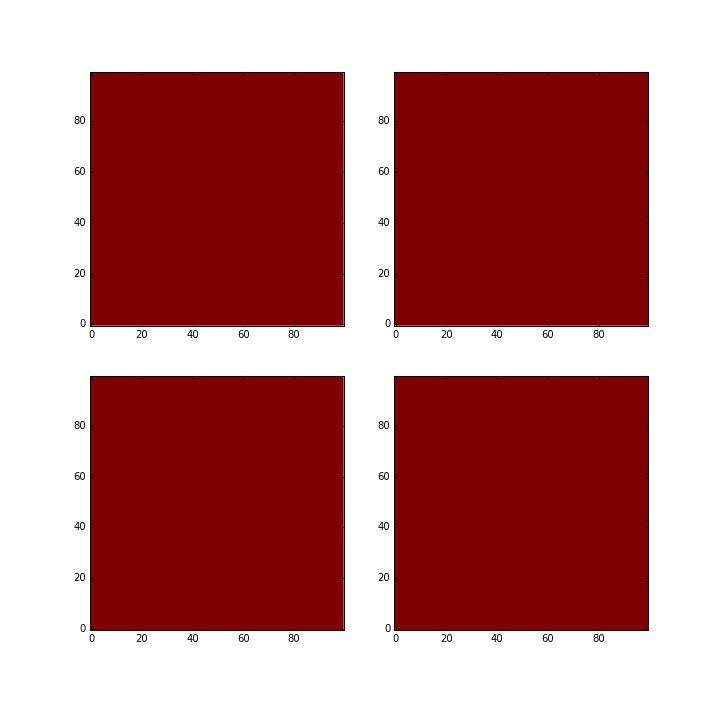
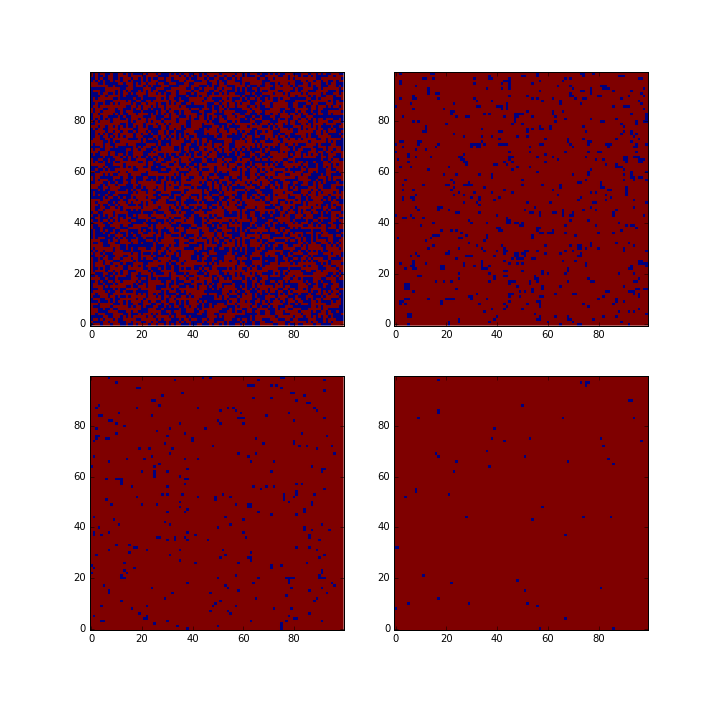
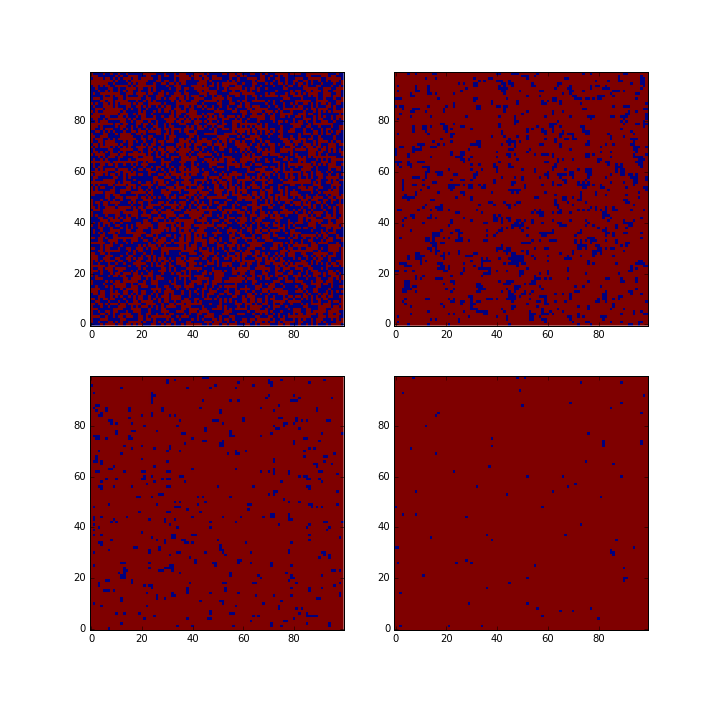
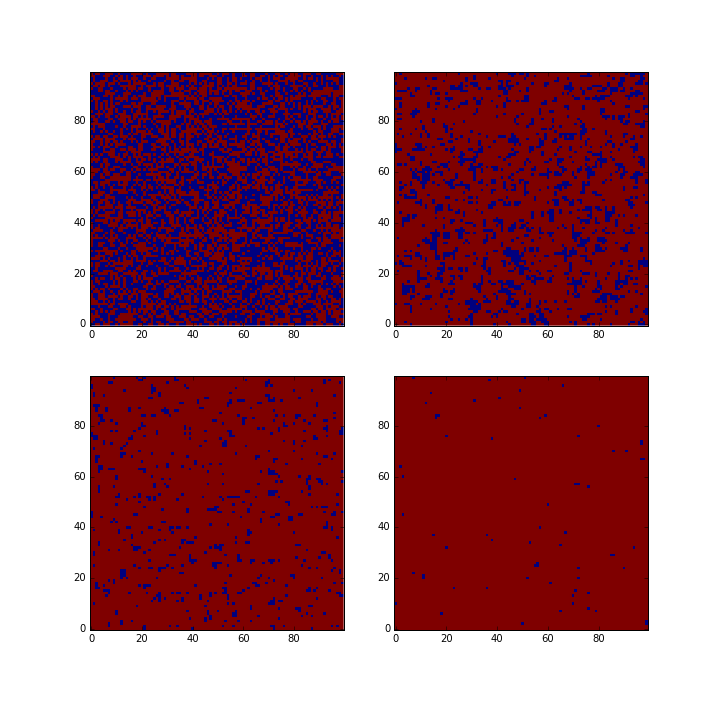
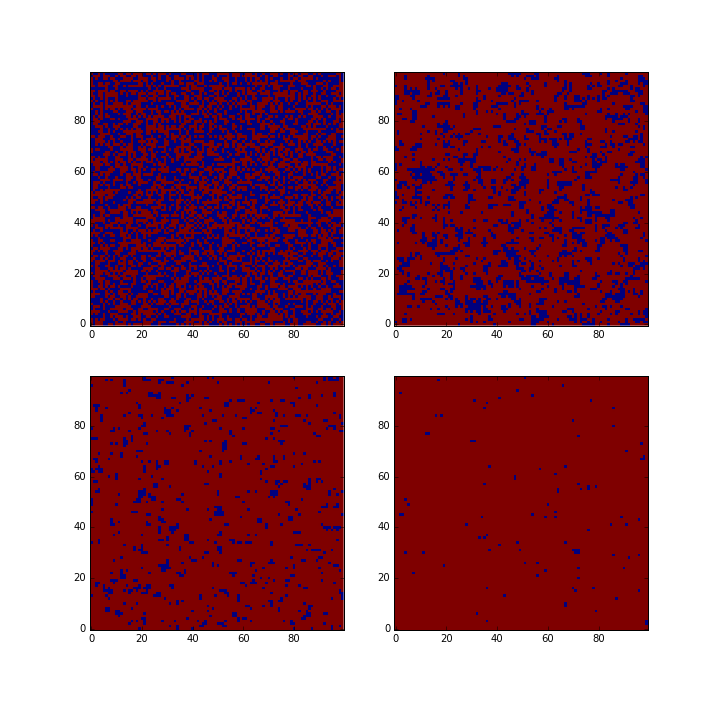
...
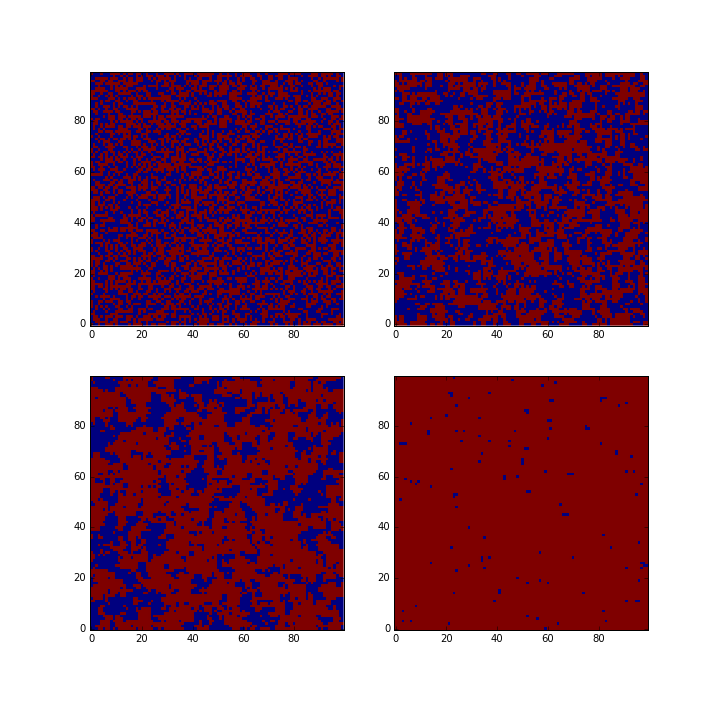
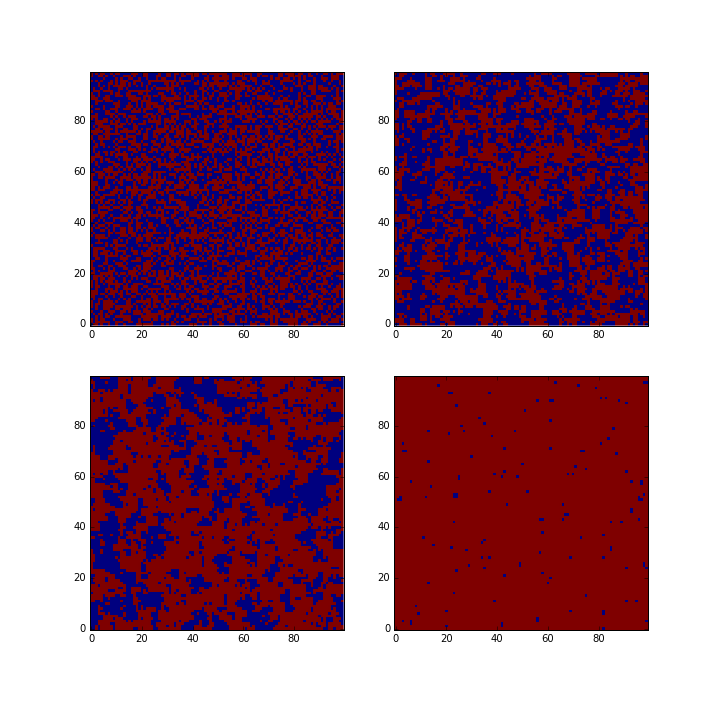
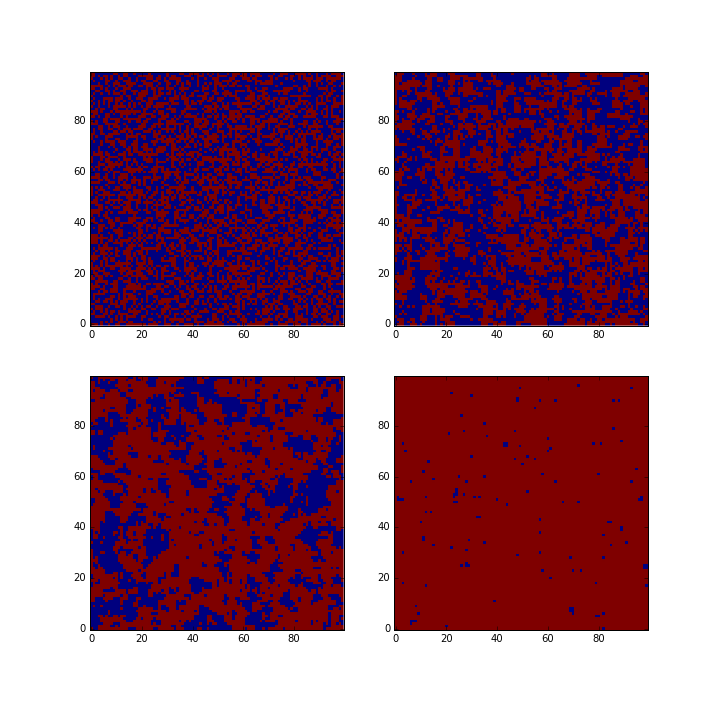
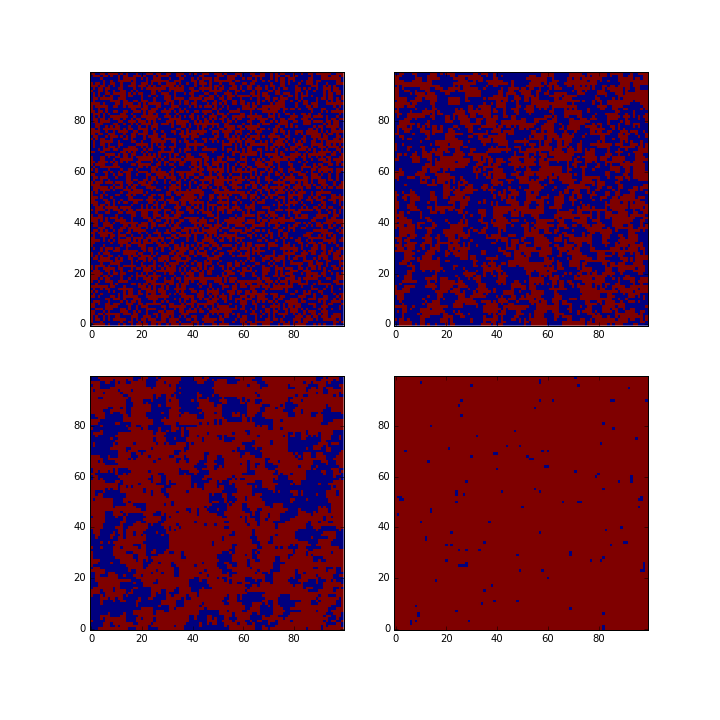
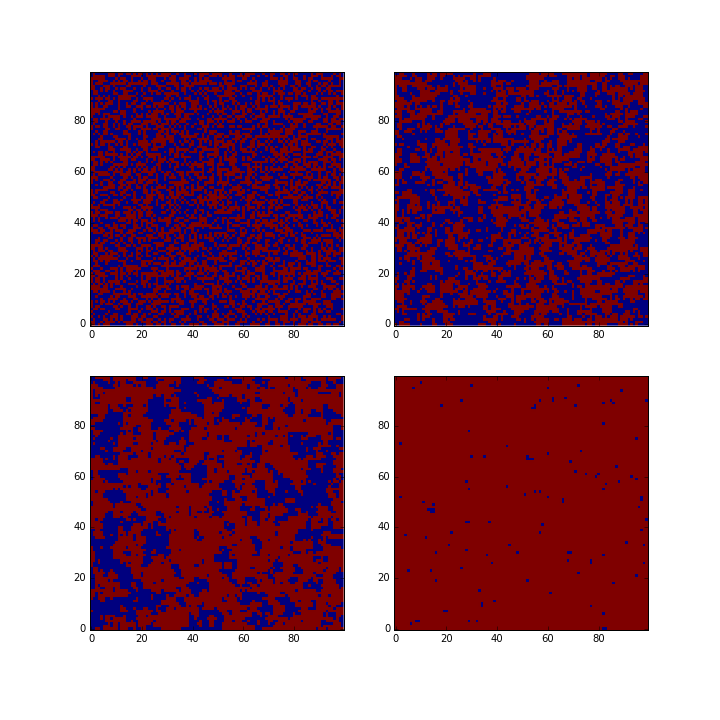

In [20]:
fig = pyplot.figure(figsize=(10,10))

pyplot.subplot(2, 2, 1)
img1 = pyplot.imshow(states_0[0],interpolation="none",origin='lower',\
                     vmin=-1, vmax=1)

pyplot.subplot(2, 2, 2)
img2 = pyplot.imshow(states_0_3[0],interpolation="none",origin='lower',\
                     vmin=-1, vmax=1)
pyplot.subplot(2, 2, 3)
img3 = pyplot.imshow(states_0_4[0],interpolation="none",origin='lower',\
                     vmin=-1, vmax=1)

pyplot.subplot(2, 2, 4)
img4 = pyplot.imshow(states_0_6[0],interpolation="none",origin='lower',\
                     vmin=-1, vmax=1)

# Animate
def animate(i):
    img1.set_array(states_0[i])
    img2.set_array(states_0_3[i])
    img3.set_array(states_0_4[i])
    img4.set_array(states_0_6[i])
    
animation.FuncAnimation(fig, animate, frames=NMC, interval=200)

We clearly see our critical value for $\alpha$ will be between 0.4 and 0.6.

* **Plotting the evolution of the magnetization (total spin)**

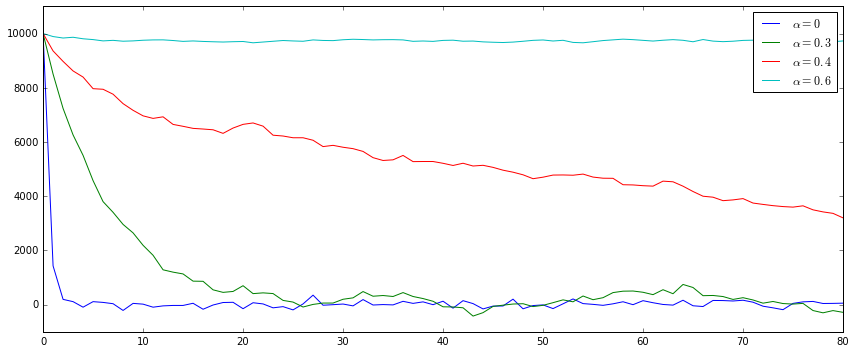

In [13]:
pyplot.figure(figsize=(12,5))
axes = pyplot.gca()
axes.set_xlim([0,80])
axes.set_ylim([-1000,11000])
pyplot.plot(states_0.sum(axis=(1,2)),label=r'$\alpha=0$')
pyplot.plot(states_0_3.sum(axis=(1,2)),label=r'$\alpha=0.3$')
pyplot.plot(states_0_4.sum(axis=(1,2)),label=r'$\alpha=0.4$')
pyplot.plot(states_0_6.sum(axis=(1,2)),label=r'$\alpha=0.6$')
pyplot.legend()
pyplot.tight_layout()

### Now that we saw how it looks, let's get some values

* **Function to calculate the total magnetization**

\begin{equation}
M_X=\sum_{i=1}^N s_i
\end{equation}

In [14]:
def total_magnetization(sp):
    
    r = sp.sum()
    
    return r

* **Function to calculate the energy variation**

\begin{equation}
\Delta E = -{\alpha} s_i \sum_{j \in n(i)} s_j 
\end{equation}

In [15]:
def energy_variation(sp, alpha):
    
    dE = -alpha*sp[:, :]*(sp.sum())
    
    return dE

* **Now we need functions for the average magnetisation and energy**

$$
<E> = \frac{\sum_k E_k}{N_k}\\
<M> = \frac{\sum_k M_k}{N_k}
$$

The total number of states is ${N_k} = nx\times ny = 100\times 100 = 10000$

In [16]:
def average_M(sp, Nk) :
    M = total_magnetization(sp).sum()/Nk
    return M

In [17]:
def average_E(sp, Nk, alpha) :
    E = energy_variation(sp, alpha).sum()/Nk
    return E

* **Let's try these for different $\alpha$ 's**

In [18]:
nx = 100
ny = 100
Nk = 10000

alpha = numpy.linspace(0, 1, 20)
M = numpy.linspace(0, 1, 20)
E = numpy.linspace(0, 1, 20)

for i in range(len(alpha)) :
    
    a = alpha[i]
    print(a)
    
    NMC=100
    sp = numpy.ones([nx,ny])
    states_i = ising_model_metropolis(sp, NMC, nx, ny, a) 
    M[i] = average_M(states_i, Nk)
    E[i] = average_E(states_i, Nk, a)
    
print(E)
print(M)
print(alpha)

0.0
0.0526315789474
0.105263157895
0.157894736842
0.210526315789
0.263157894737
0.315789473684
0.368421052632
0.421052631579
0.473684210526
0.526315789474
0.578947368421
0.631578947368
0.684210526316
0.736842105263
0.789473684211
0.842105263158
0.894736842105
0.947368421053
1.0
[  0.00000000e+00  -8.45155705e+02  -1.76910838e+03  -6.52849825e+03
  -1.39028885e+04  -3.24878552e+04  -2.90413465e+05  -1.75712226e+06
  -1.73580583e+07  -3.72132368e+07  -4.74348224e+07  -5.50542489e+07
  -6.19938765e+07  -6.82399936e+07  -7.41704416e+07  -7.99042505e+07
  -8.54129355e+07  -9.09737722e+07  -9.64318090e+07  -1.01869053e+08]
[   1.218     1.2672    1.2964    2.0334    2.5698    3.5136    9.5898
   21.8388   64.207    88.6348   94.9348   97.516    99.0742   99.8676
  100.3294  100.6042  100.7114  100.8348  100.8906  100.9302]
[ 0.          0.05263158  0.10526316  0.15789474  0.21052632  0.26315789
  0.31578947  0.36842105  0.42105263  0.47368421  0.52631579  0.57894737
  0.63157895  0.68421053 

Now let's check on a plot what these values look like :

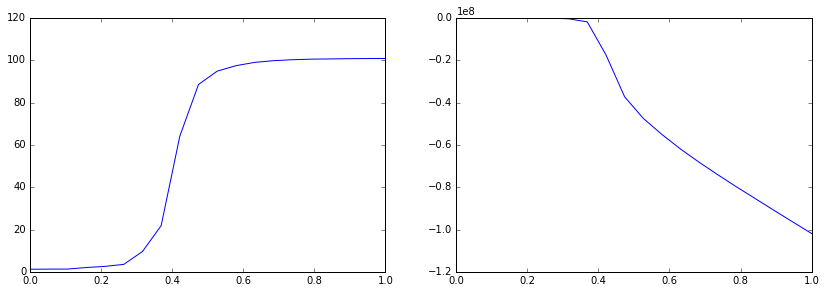

In [33]:
pyplot.figure(figsize=(14,10))
pyplot.subplot(2, 2, 1)
pyplot.plot(alpha, M)
pyplot.subplot(2, 2, 2)
pyplot.plot(alpha, E)

Well it looks like what we expected but we have a problem with a coefficient somewhere, as the magnetization (on the left) evolves in a 100 times bigger scale than the energy. After many tries, we did not succed in finding where our error was, maybe it is how it should look like ? We're not convinced !

Anyway, despite our probable error somewhere, we can still clearly see that the **critical value of  $\alpha$ is around 0.45 **:

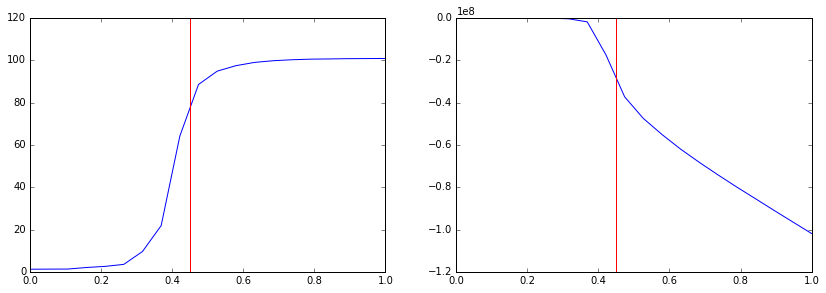

In [38]:
pyplot.figure(figsize=(14,10))
pyplot.subplot(2, 2, 1)
pyplot.plot(alpha, M)
pyplot.axvline(0.45, color='red')
pyplot.subplot(2, 2, 2)
pyplot.plot(alpha, E)
pyplot.axvline(0.45, color='red')

## Trying with a different initial state and boundary conditions

We will assume as suggested that on the borders all the spins are pointing upwards on the borders while they are randomly oriented in the bulk.

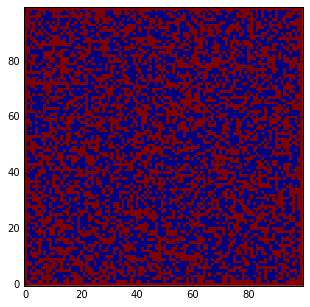

In [67]:
nx = 100
ny = 100


def sp_try(nx,ny):
    sp = numpy.random.random_integers(0,1,(nx,ny))

    for i in range(ny) :
        sp[0,i] = 1
        sp[-1,i] = 1
    
    for i in range(nx) :
        sp[i,0] = 1
        sp[i,-1] = 1
    sp[sp==0] =-1
    
    return sp


sp = sp_try(nx,ny)


pyplot.figure(figsize=(5,5))
pyplot.imshow(sp,interpolation="none",origin='lower')

Now let's se again how it looks like with these different initial conditions and boundary conditions

In [45]:
nx = 100
ny = 100

sp0 = sp.copy()

NMC=100
alpha=0

states_0 = ising_model_metropolis(sp0, NMC, nx, ny, alpha)

In [46]:
NMC=100
sp03 = sp.copy()
alpha=0.3
states_0_3 = ising_model_metropolis(sp03, NMC, nx, ny, alpha)

In [47]:
NMC=100
sp04 = sp.copy()
alpha=0.4
states_0_4 = ising_model_metropolis(sp04, NMC, nx, ny, alpha)

In [48]:
NMC=100
sp06 = sp.copy()
alpha=0.6
states_0_6 = ising_model_metropolis(sp06, NMC, nx, ny, alpha)


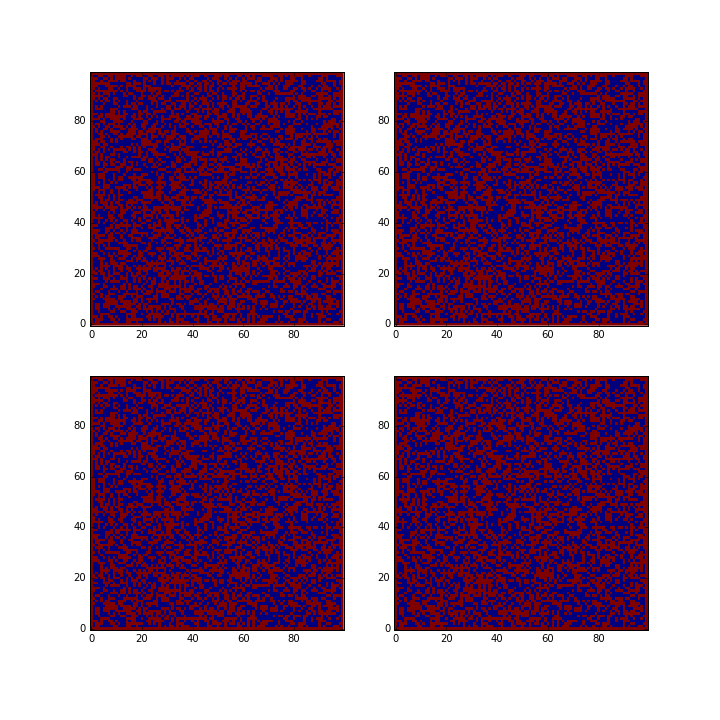
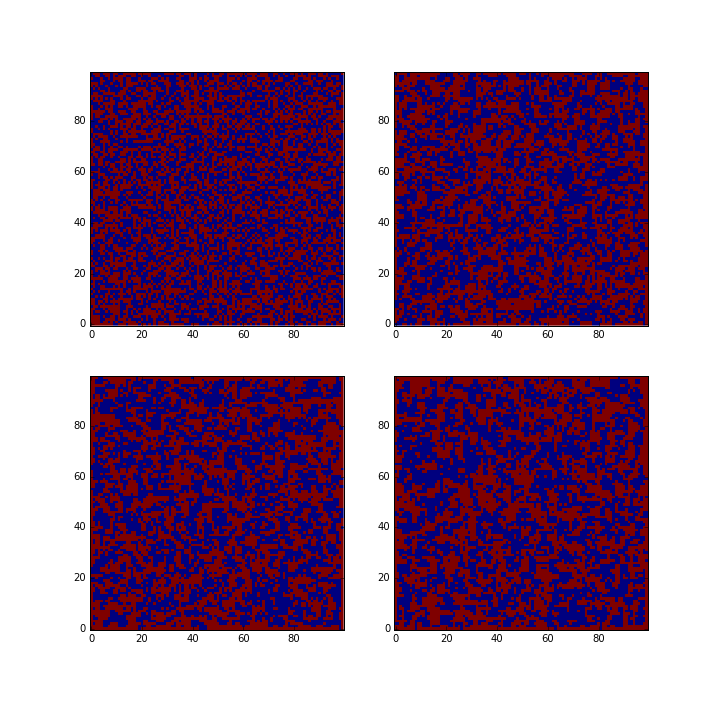
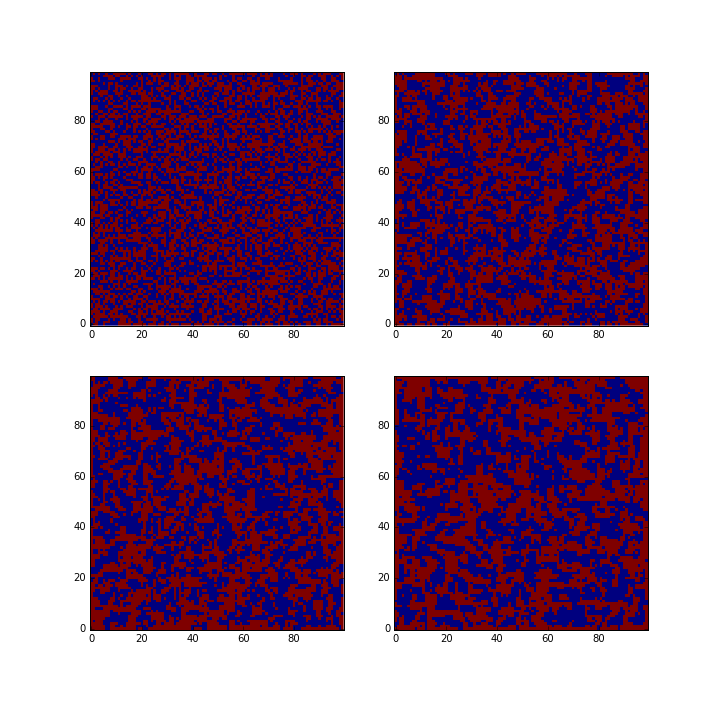
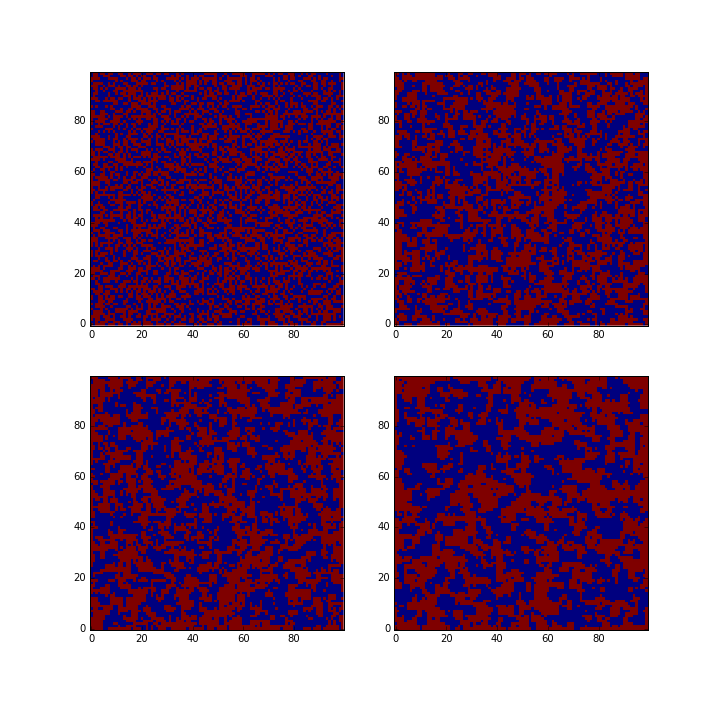
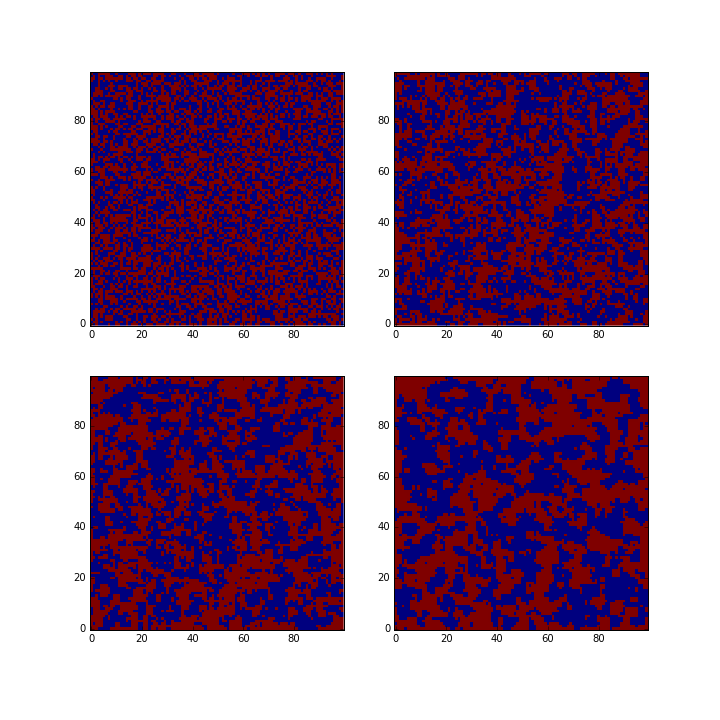
...
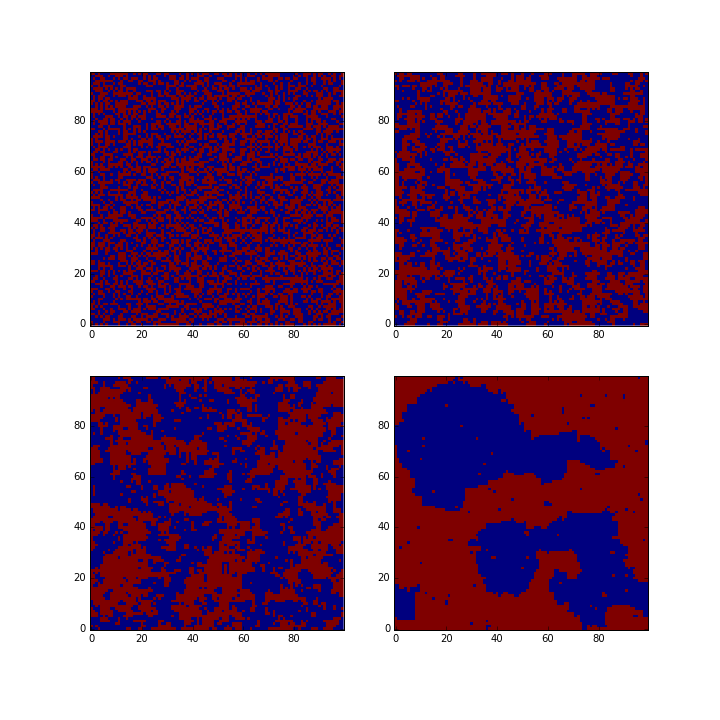
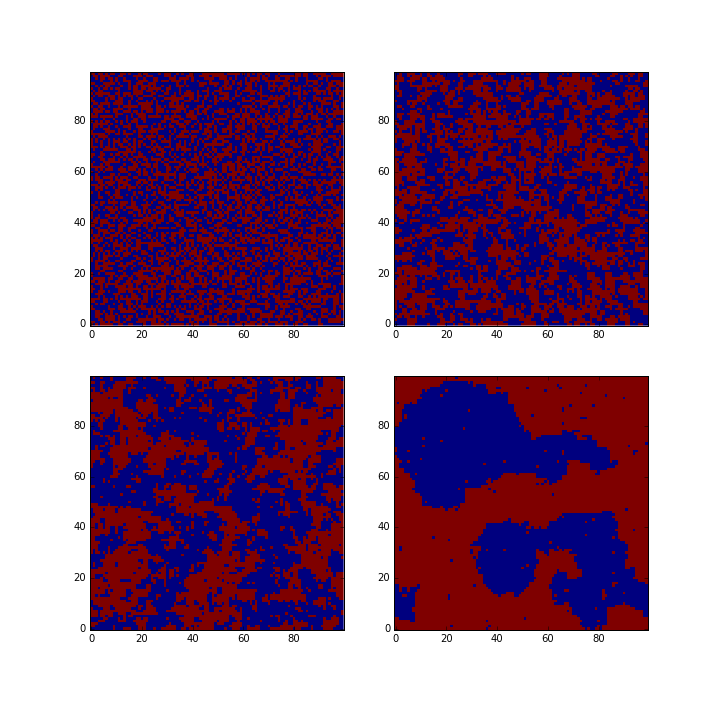
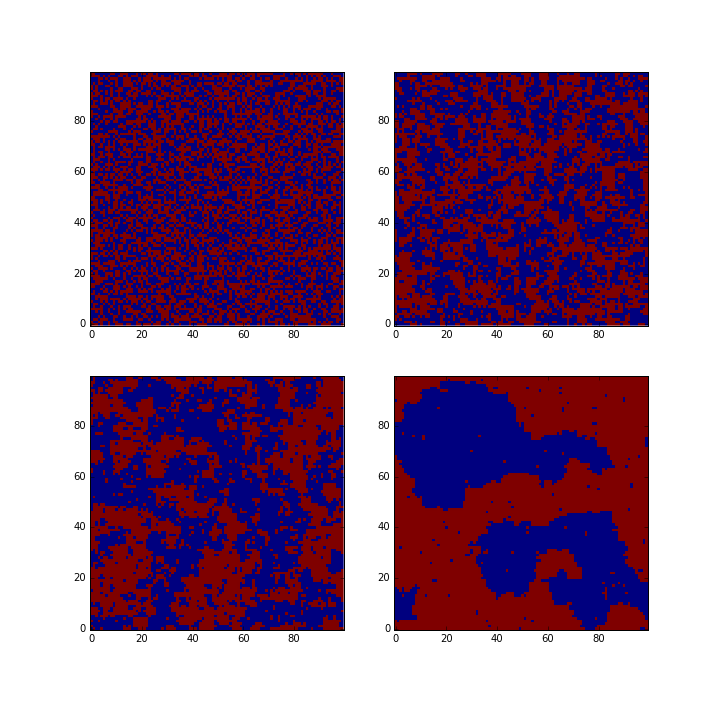
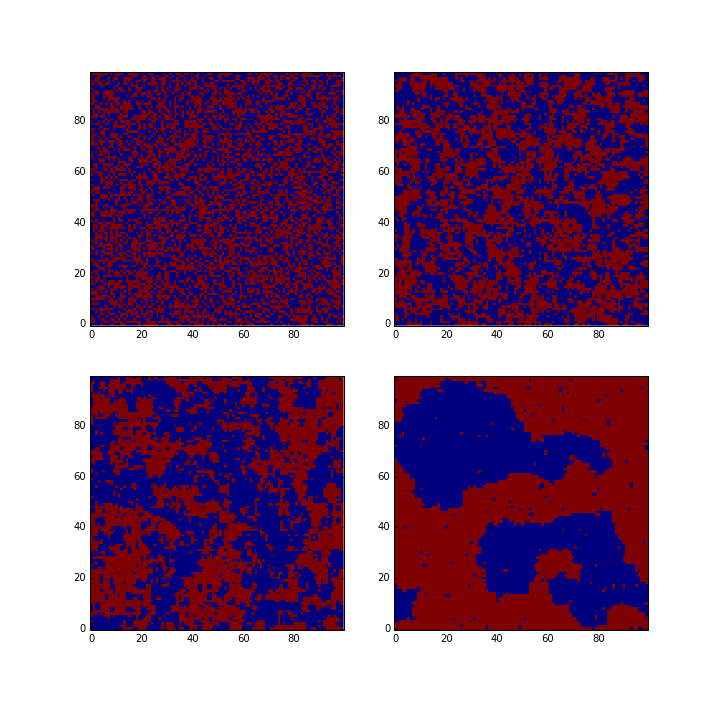
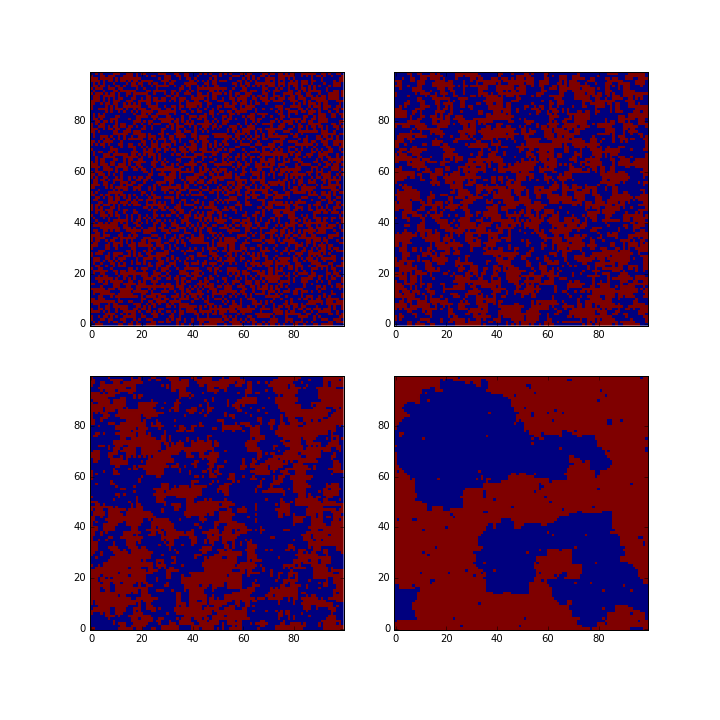

In [49]:
fig = pyplot.figure(figsize=(10,10))

pyplot.subplot(2, 2, 1)
img1 = pyplot.imshow(states_0[0],interpolation="none",origin='lower',\
                     vmin=-1, vmax=1)

pyplot.subplot(2, 2, 2)
img2 = pyplot.imshow(states_0_3[0],interpolation="none",origin='lower',\
                     vmin=-1, vmax=1)
pyplot.subplot(2, 2, 3)
img3 = pyplot.imshow(states_0_4[0],interpolation="none",origin='lower',\
                     vmin=-1, vmax=1)

pyplot.subplot(2, 2, 4)
img4 = pyplot.imshow(states_0_6[0],interpolation="none",origin='lower',\
                     vmin=-1, vmax=1)

# Animate
def animate(i):
    img1.set_array(states_0[i])
    img2.set_array(states_0_3[i])
    img3.set_array(states_0_4[i])
    img4.set_array(states_0_6[i])
    
animation.FuncAnimation(fig, animate, frames=NMC, interval=200)

Looks quite interesting !
The spins seem to have a tendency to regroup.

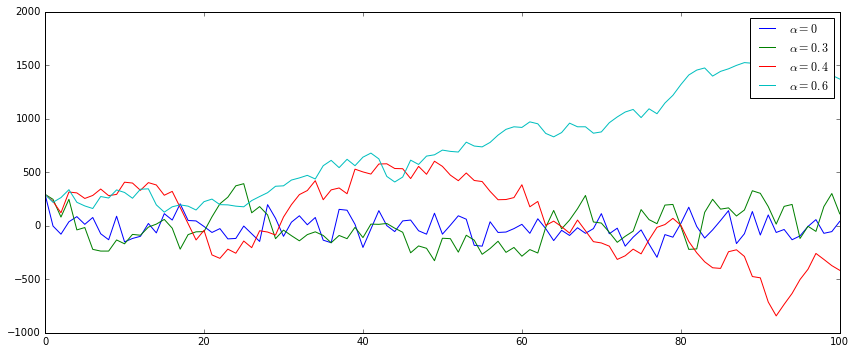

In [53]:
pyplot.figure(figsize=(12,5))
axes = pyplot.gca()
axes.set_xlim([0,100])
axes.set_ylim([-1000,2000])
pyplot.plot(states_0.sum(axis=(1,2)),label=r'$\alpha=0$')
pyplot.plot(states_0_3.sum(axis=(1,2)),label=r'$\alpha=0.3$')
pyplot.plot(states_0_4.sum(axis=(1,2)),label=r'$\alpha=0.4$')
pyplot.plot(states_0_6.sum(axis=(1,2)),label=r'$\alpha=0.6$')
pyplot.legend()
pyplot.tight_layout()

And well, this time the magnetizations seems to increase as $\alpha$ is getting bigger.

However, the fluctuations are too important to let us conclude anything really consequent.

* **To finish with the assignment, let's now see the results of the analysis with these new intial and boundary conditions :**

In [ ]:
nx = 100
ny = 100
Nk = 10000

alpha = numpy.linspace(0, 1, 20)
M = numpy.linspace(0, 1, 20)
E = numpy.linspace(0, 1, 20)

for i in range(len(alpha)) :
    
    a = alpha[i]
    print(a)
    
    sp = sp_try(nx,ny)
    
    NMC=100
    
    states_i = ising_model_metropolis(sp, NMC, nx, ny, a) 
    M[i] = average_M(states_i, Nk)
    E[i] = average_E(states_i, Nk, a)
    
print(E)
print(M)
print(alpha)

0.0
0.0526315789474
0.105263157895
0.157894736842
0.210526315789
0.263157894737
0.315789473684
0.368421052632
0.421052631579


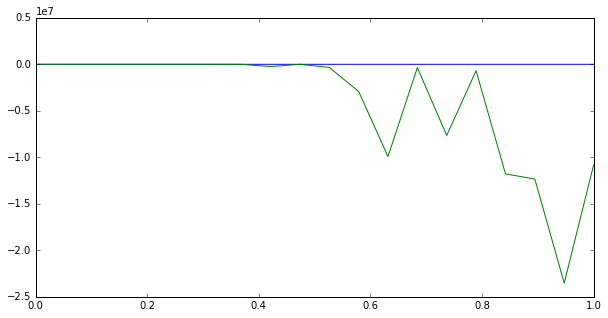

In [70]:
pyplot.figure(figsize=(10,5))

pyplot.plot(alpha, M)

pyplot.plot(alpha, E)
